## BiLSTM - Fake News Detection
#### This Bilateral Long Short Term Memory Model aims to determine, based on an article title and content, if it is fake news or misinformation.

#### The data was sourced from Kaggle where it was prelabled from multiple different news sources.

In [2]:
pip install language-tool-python

### 0. Imports

In [3]:
# Imports
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import pandas as pd
from tqdm import tqdm
import nltk
nltk.download('punkt_tab')
from nltk.tokenize import word_tokenize
from google.colab import drive
import language_tool_python

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


### 1. Load Data

In [4]:
# Loading the data
drive.mount('/content/drive')
#data = pd.read_csv('/content/WELFake_Dataset.csv')

data = pd.read_csv('/content/drive/MyDrive/CS4801/WELFake_Dataset.csv')

Mounted at /content/drive


In [5]:
# Taking an initial look
# label: 0 = fake and 1 = real
data.head()

,Unnamed: 0,title,text,label
0,0,LAW ENFORCEMENT ON HIGH ALERT Following Threat...,No comment is expected from Barack Obama Membe...,1
1,1,NaN,Did they post their votes for Hillary already?,1
2,2,UNBELIEVABLE! OBAMA’S ATTORNEY GENERAL SAYS MO...,"Now, most of the demonstrators gathered last ...",1
3,3,"Bobby Jindal, raised Hindu, uses story of Chri...",A dozen politically active pastors came here f...,0
4,4,SATAN 2: Russia unvelis an image of its terrif...,"The RS-28 Sarmat missile, dubbed Satan 2, will...",1


In [6]:
# Dropping unnamed index column
data.drop('Unnamed: 0', axis=1, inplace=True)
data.head()

,title,text,label
0,LAW ENFORCEMENT ON HIGH ALERT Following Threat...,No comment is expected from Barack Obama Membe...,1
1,NaN,Did they post their votes for Hillary already?,1
2,UNBELIEVABLE! OBAMA’S ATTORNEY GENERAL SAYS MO...,"Now, most of the demonstrators gathered last ...",1
3,"Bobby Jindal, raised Hindu, uses story of Chri...",A dozen politically active pastors came here f...,0
4,SATAN 2: Russia unvelis an image of its terrif...,"The RS-28 Sarmat missile, dubbed Satan 2, will...",1


In [7]:
data.isna().sum()

,0
title,558
text,39
label,0


In [8]:
# Just checking to make sure we don't have any total NAs (i.e. both title and text are empty)
data['both_na'] = data['title'].isna() & data['text'].isna()
data['both_na'].sum()

0

In [9]:
# Don't need to keep this
data.drop('both_na', axis=1, inplace=True)

### 2. Process Data

#### 2.1: Combine title and article

In the original version, the columns are combined regardless if one was empty.

This final version will drop all rows that have the text portion missing, as that significantly limits the words it has to make a prediction with.

In [10]:
data.dropna(subset=['text'],inplace=True)
data.isna().sum()

,0
title,558
text,0
label,0


In [11]:
# Preprocess Data
data['label'] = data['label'].astype(float) # Need this to be a float for future use
# Since there are some NA values in the title column, we must fill them when creating the combined column
data['content'] = data['title'].fillna('') + data['text']
data['content'].head()

,content
0,LAW ENFORCEMENT ON HIGH ALERT Following Threat...
1,Did they post their votes for Hillary already?
2,UNBELIEVABLE! OBAMA’S ATTORNEY GENERAL SAYS MO...
3,"Bobby Jindal, raised Hindu, uses story of Chri..."
4,SATAN 2: Russia unvelis an image of its terrif...


#### 2.2: Tokenize

In [12]:
# Tokenize and Vocabulary (Convert words to IDs)
# Using set to ignore duplicate values
all_words = set(word for content in data['content'] for word in word_tokenize(content.lower()))
vocab = {word: i + 1 for i, word in enumerate(all_words)}  # Reserve 0 for padding

In [13]:
print(all_words)
print(vocab)

{'fidler', 'trump-email.com', 'bomb-clock', 'time.perhaps', 'charring', 'wriggled', 'mussa', 'demandswashington', 'debtspastor', 'defecates', 'suvarnabhumi', 'jettison', 'unocal', 'go.things', 'hypnotise', 'jew-hatred', 'stargate', 'grasping', '//humansarefree.com/2016/11/colorado-cannabis-industry-contributes.html', 'appearance', 'reluctance.', 'beds', 'extremistsprague', 'однопартийца', 'vorsitz', 'baden-wuerttemberg', 'borick', '//chinarising.puntopress.com/2016/10/18/so-called-communist-china-an-exclusive-article-for-the-all-china-review-16-10-17/', '7-cent', 'mainlandization', 'expresidente', 'statesback', 'vieh-', 'никакая', 'headlights', 'crowdtangle', 'wenige', 'after-party', '1341', 'diaz-atienza', 'v=rdhzameiwrs', 'obama—the', 'lewis.', 'have.considering', 'tiesit', 'deceptions', 'choir', 'slawson.michael', 'favourites', 'divest', 'holla', 'american.it', 'barcaloungers', 'apprentissage', 'everybody', 'moodmoscow', '2003-2009.', 'tactfully', '17,898-day-long', '2,700.after', '

#### 2.3: Encode

In [14]:
# Encoding: Converts each article into a list of integers
def encode_text(text):
    return [vocab.get(word, 0) for word in word_tokenize(text.lower())]

data['encoded'] = data['content'].apply(encode_text)
data['encoded'].head()

,encoded
0,"[318674, 120023, 34531, 173914, 134983, 299773..."
1,"[342541, 293889, 242332, 22256, 284950, 151679..."
2,"[422491, 395602, 141697, 81199, 320992, 121646..."
3,"[321995, 325796, 311888, 268002, 270649, 31188..."
4,"[85301, 147375, 221630, 22324, 101022, 10265, ..."


#### 2.4: Pad (also limit the length of the text to be analyzed)

In [15]:
# Pad sequences to fixed length (adds 0s if they are less than the max length)
MAX_SEQ_LENGTH = 100 # Just chose 100 words for intital tests, this can be changed
data['padded'] = data['encoded'].apply(lambda x: x[:MAX_SEQ_LENGTH] + [0] * (MAX_SEQ_LENGTH - len(x)) if
                                       len(x) < MAX_SEQ_LENGTH else x[:MAX_SEQ_LENGTH])
data['padded'].head()

,padded
0,"[318674, 120023, 34531, 173914, 134983, 299773..."
1,"[342541, 293889, 242332, 22256, 284950, 151679..."
2,"[422491, 395602, 141697, 81199, 320992, 121646..."
3,"[321995, 325796, 311888, 268002, 270649, 31188..."
4,"[85301, 147375, 221630, 22324, 101022, 10265, ..."


In [16]:
# Just to see all the new columns together
data.head()

,title,text,label,content,encoded,padded
0,LAW ENFORCEMENT ON HIGH ALERT Following Threat...,No comment is expected from Barack Obama Membe...,1.0,LAW ENFORCEMENT ON HIGH ALERT Following Threat...,"[318674, 120023, 34531, 173914, 134983, 299773...","[318674, 120023, 34531, 173914, 134983, 299773..."
1,NaN,Did they post their votes for Hillary already?,1.0,Did they post their votes for Hillary already?,"[342541, 293889, 242332, 22256, 284950, 151679...","[342541, 293889, 242332, 22256, 284950, 151679..."
2,UNBELIEVABLE! OBAMA’S ATTORNEY GENERAL SAYS MO...,"Now, most of the demonstrators gathered last ...",1.0,UNBELIEVABLE! OBAMA’S ATTORNEY GENERAL SAYS MO...,"[422491, 395602, 141697, 81199, 320992, 121646...","[422491, 395602, 141697, 81199, 320992, 121646..."
3,"Bobby Jindal, raised Hindu, uses story of Chri...",A dozen politically active pastors came here f...,0.0,"Bobby Jindal, raised Hindu, uses story of Chri...","[321995, 325796, 311888, 268002, 270649, 31188...","[321995, 325796, 311888, 268002, 270649, 31188..."
4,SATAN 2: Russia unvelis an image of its terrif...,"The RS-28 Sarmat missile, dubbed Satan 2, will...",1.0,SATAN 2: Russia unvelis an image of its terrif...,"[85301, 147375, 221630, 22324, 101022, 10265, ...","[85301, 147375, 221630, 22324, 101022, 10265, ..."


### 3. Split Data

In [17]:
# Train-test split
train_data, test_data = train_test_split(data, test_size=0.2, random_state=42)

In [18]:
print(len(train_data))
print(len(test_data))

57676
14419


In [19]:
# Dataset Class: access and batch the data
class WELfakeDataset(Dataset):
    def __init__(self, data):
        self.data = data
        self.labels = data['label'].values
        self.texts = torch.tensor(data['padded'].tolist(), dtype=torch.long)

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        return self.texts[idx], torch.tensor(self.labels[idx], dtype=torch.float32)

In [20]:
# Dataloaders
train_dataset = WELfakeDataset(train_data)
test_dataset = WELfakeDataset(test_data)
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)

### 4. Define Model

In [21]:
# Define Basic Bidirectional LSTM Model
class BiLSTM(nn.Module):
    def __init__(self, vocab_size, embedding_dim, hidden_dim):
        super(BiLSTM, self).__init__()
        self.embedding = nn.Embedding(vocab_size, embedding_dim, padding_idx=0)
        self.lstm = nn.LSTM(embedding_dim, hidden_dim, bidirectional=True, batch_first=True)
        self.fc = nn.Linear(hidden_dim * 2, 1)  # hidden_dim * 2 because it's bidirectional

    def forward(self, text):
        embedded = self.embedding(text)
        _, (hidden, _) = self.lstm(embedded)
        # Concatenate the final forward and backward hidden states
        hidden = torch.cat((hidden[-2], hidden[-1]), dim=1)
        output = self.fc(hidden)
        return output.squeeze(1)


In [22]:
# Hyperparameters
EMBEDDING_DIM = 50
HIDDEN_DIM = 64
LEARNING_RATE = 0.001
EPOCHS = 5

# Initialize model, optimizer, and loss function
vocab_size = len(vocab) + 1
model = BiLSTM(vocab_size, EMBEDDING_DIM, HIDDEN_DIM)
optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)
criterion = nn.BCEWithLogitsLoss()

### 5.Train

In [23]:
# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

# Training Loop
for epoch in range(EPOCHS):
    model.train()
    train_loss = 0
    for texts, labels in tqdm(train_loader):
        texts, labels = texts.to(device), labels.to(device)

        optimizer.zero_grad()
        predictions = model(texts)
        loss = criterion(predictions, labels)
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
    print(f'Epoch {epoch+1}, Training Loss: {train_loss / len(train_loader)}')



100%|██████████| 902/902 [09:20<00:00,  1.61it/s]


Epoch 1, Training Loss: 0.21358534050594288


100%|██████████| 902/902 [09:20<00:00,  1.61it/s]


Epoch 2, Training Loss: 0.0904575381967489


100%|██████████| 902/902 [09:36<00:00,  1.56it/s]


Epoch 3, Training Loss: 0.04856161100822429


100%|██████████| 902/902 [09:27<00:00,  1.59it/s]


Epoch 4, Training Loss: 0.030372299323505835


100%|██████████| 902/902 [09:28<00:00,  1.59it/s]

Epoch 5, Training Loss: 0.02024976954797485


#### 6. Evaluate

In [26]:
# Evaluation
model.eval()
all_preds = []
all_labels = []
with torch.no_grad():
    for texts, labels in test_loader:
        texts, labels = texts.to(device), labels.to(device)
        predictions = torch.sigmoid(model(texts)).round()
        all_preds.extend(predictions.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

accuracy = accuracy_score(all_labels, all_preds)
print(f'Test Accuracy: {accuracy:.4f}')

Test Accuracy: 0.9783


In [27]:
# Get precision, recall, and F1 score
precision = precision_score(all_labels, all_preds)
recall = recall_score(all_labels, all_preds)
f1 = f1_score(all_labels, all_preds)
print("Precision:", precision)
print("Recall:", recall)
print("F1 score:", f1)


Precision: 0.9798485258317555
Recall: 0.9778647590767985
F1 score: 0.9788556373708032


In [28]:
# Print classification report
# Again, 0 = fake and 1 = real
target_names = ['Fake News', 'Real News']
print(classification_report(all_labels, all_preds, target_names=target_names))

              precision    recall  f1-score   support

   Fake News       0.98      0.98      0.98      7010
   Real News       0.98      0.98      0.98      7409

    accuracy                           0.98     14419
   macro avg       0.98      0.98      0.98     14419
weighted avg       0.98      0.98      0.98     14419



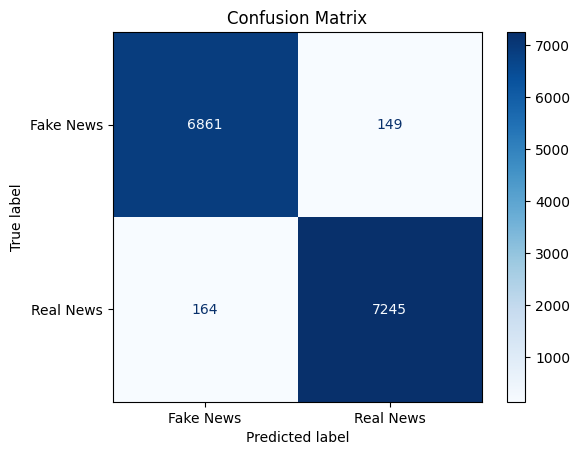

In [29]:
# Make an confusion matrix
cm = confusion_matrix(all_labels, all_preds)

# Plot the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=target_names)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.show()

#### 7. Elaborate

##### 7.1 Grammar/Spelling issues

In [ ]:
tool = language_tool_python.LanguageTool('en-US')

In [ ]:
# split data into true and fake based on pre-defined labels

# will probably also make sure data is in english
true_data = data[data['label'] == 0]
fake_data = data[data['label'] == 1]

In [ ]:
# get the number of spelling issues present in 500 true rows
count_spelling_issues = 0
for i in range(500):
  text = true_data.iloc[i]['title']
  matches = tool.check(text)
  if len(matches) > 0:
    count_spelling_issues += 1

print("Real News:",count_spelling_issues," grammar/spelling issues found")
print((count_spelling_issues/500)*100)

100  grammar/spelling issues found
100.0


In [ ]:
# get the num ber of spelling errors present in 500 fake rows
count_spelling_issues = 0
for i in range(500):
  text = fake_data.iloc[i]['title']
  matches = tool.check(text)
  if len(matches) > 0:
    count_spelling_issues += 1

print("Fake News:",count_spelling_issues," grammar/spelling issues found")
print((count_spelling_issues/500)*100)

148.0
